In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
df=pd.read_csv('AB_NYC_2019.csv')

In [3]:
df

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [4]:
df.shape

(48895, 16)

In [5]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [6]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [7]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [8]:
df[df.last_review.isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


C:\Users\Pratiksinh\anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  This is separate from the ipykernel package so we can avoid doing imports until


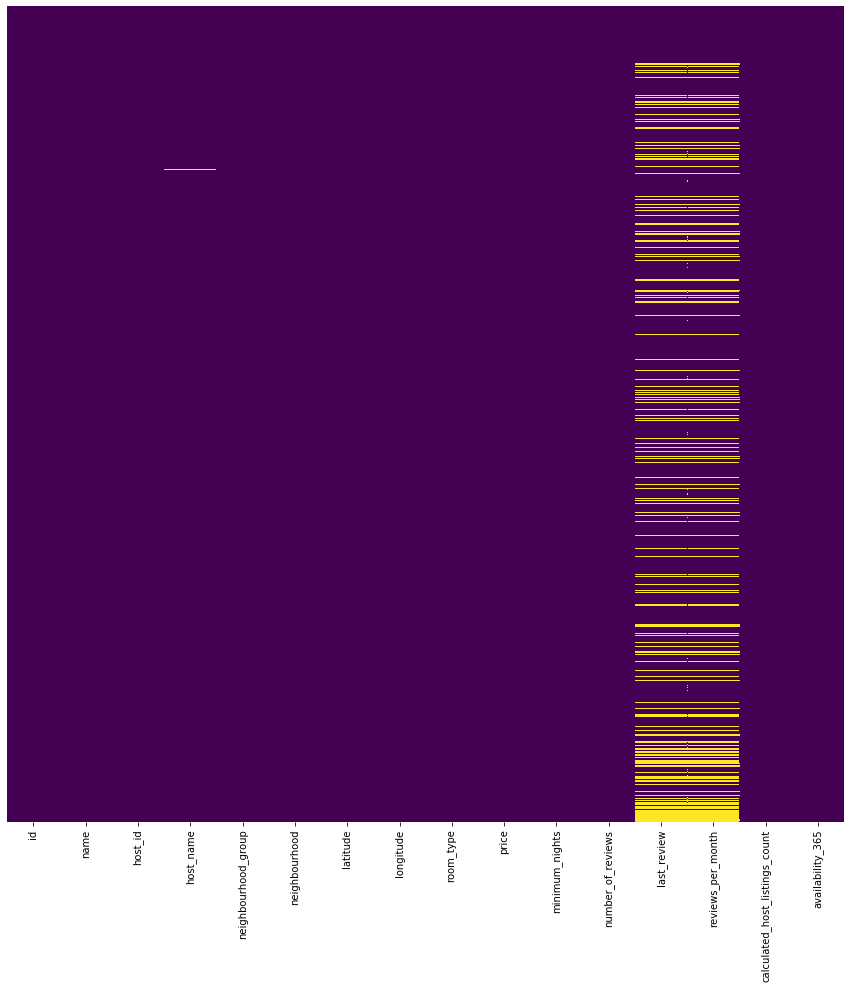

In [9]:
fig=plt.figure(figsize=(15,15))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
fig.show()

In [10]:
df['reviews_per_month'] = df['reviews_per_month'].fillna(0)
# considering no review per month as 0 because it cannot be estimated by no of review or last review 

In [11]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,19-10-2018,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,21-05-2019,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,05-07-2019,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,19-11-2018,0.10,1,0


C:\Users\Pratiksinh\anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  This is separate from the ipykernel package so we can avoid doing imports until


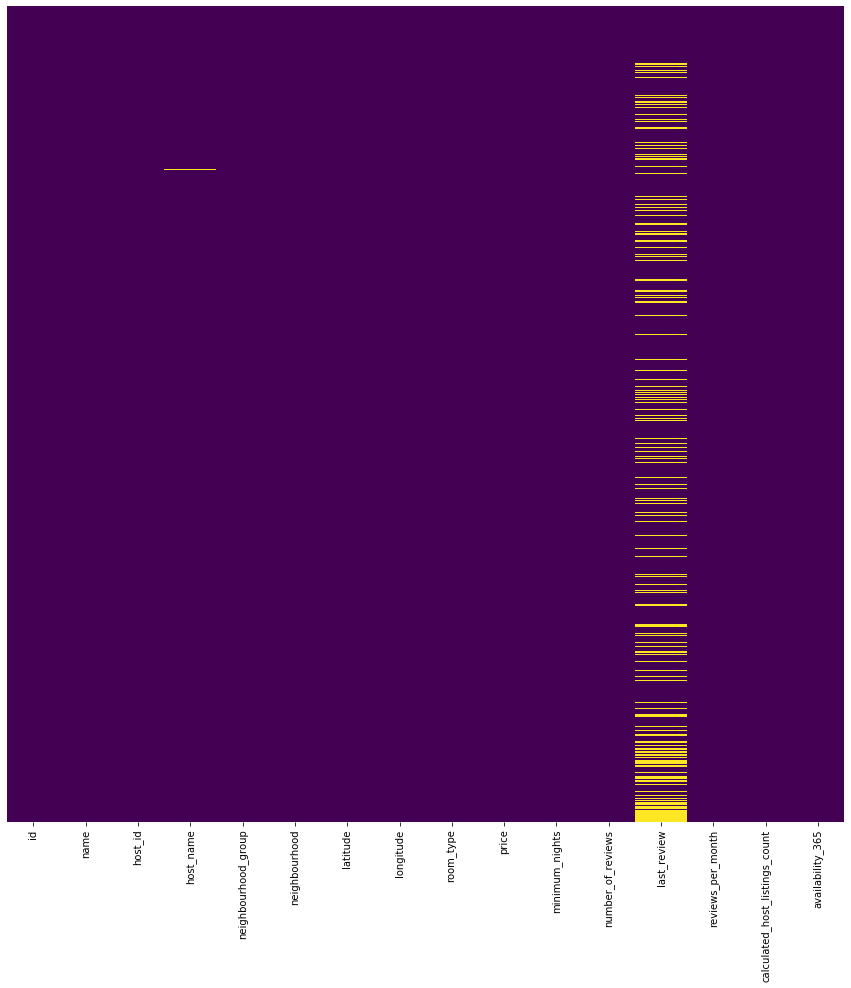

In [12]:
fig=plt.figure(figsize=(15,15))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
fig.show()

In [13]:
import datetime
df['last_review'] = df['last_review'].fillna('01-01-2000')
df['last_review']=pd.to_datetime(df['last_review'])
#imputing NA with older date. as this feature will be use to estimate recency it would not affect 

In [14]:
maxd=max(df['last_review'])
maxd

Timestamp('2019-12-06 00:00:00')

In [15]:
mind=min(df['last_review'])
mind

Timestamp('2000-01-01 00:00:00')

In [16]:
#Subtracting latest date  to oldest date

In [17]:
df['review_recency']=maxd-df['last_review']
df['review_recency'].head()

0    413 days
1    199 days
2   7279 days
3    213 days
4    382 days
Name: review_recency, dtype: timedelta64[ns]

In [18]:
max(df['review_recency'])

Timedelta('7279 days 00:00:00')

In [19]:
df.isnull().sum()

id                                 0
name                              16
host_id                            0
host_name                         21
neighbourhood_group                0
neighbourhood                      0
latitude                           0
longitude                          0
room_type                          0
price                              0
minimum_nights                     0
number_of_reviews                  0
last_review                        0
reviews_per_month                  0
calculated_host_listings_count     0
availability_365                   0
review_recency                     0
dtype: int64

C:\Users\Pratiksinh\anaconda3\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  This is separate from the ipykernel package so we can avoid doing imports until


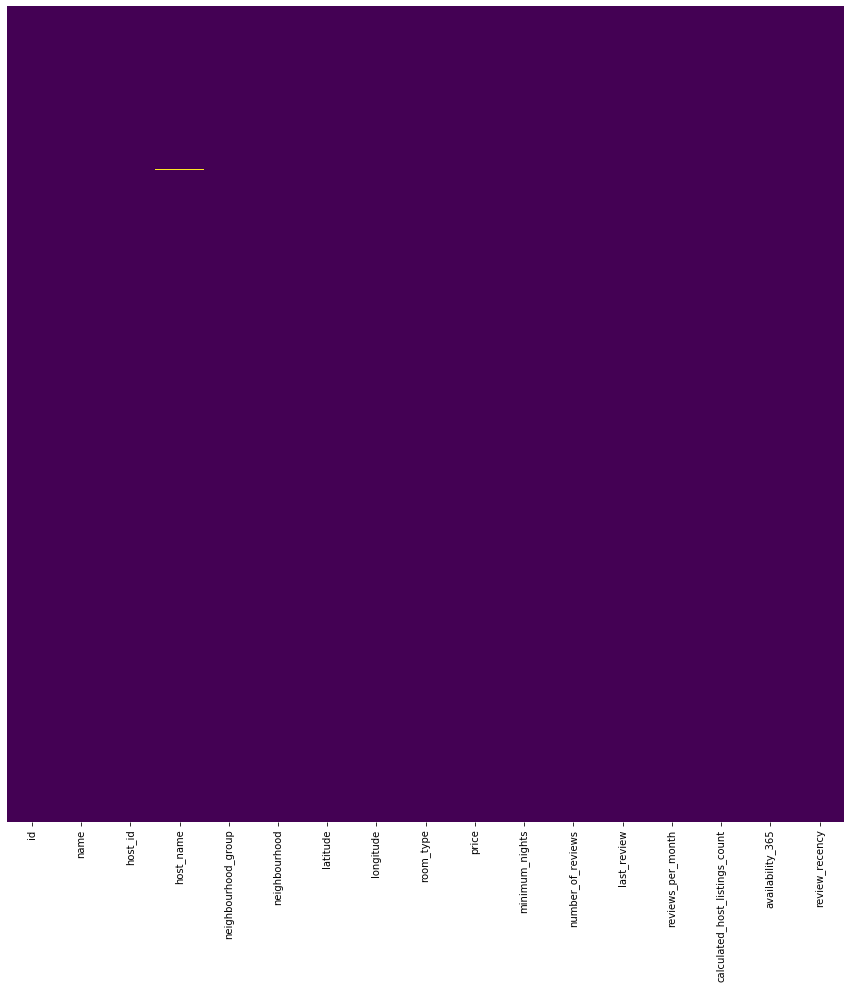

In [20]:
fig=plt.figure(figsize=(15,15))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
fig.show()

In [ ]:
sns.pairplot(df)

In [ ]:
df[df.name.isnull()==True]

In [ ]:
df[df.name.isnull()==True]=df[df.name.isnull()==True].fillna('Property')
# filling empty name with 'property'

In [ ]:
df[df.name=='Property']

In [ ]:
df.isnull().sum()

In [ ]:
df.host_name.value_counts()

In [ ]:
df[df.host_name.isnull()==True]

In [ ]:
## Wecan deop all 21 rows
df=df[~df.host_name.isnull()==True]

In [ ]:
df.head()

In [ ]:
df.shape

In [ ]:
df.info()

In [ ]:
df.isnull().sum()

In [ ]:
df['review_recency']
# removing suffix days from value

In [ ]:
df['review_recency']=df['review_recency'].dt.days

In [ ]:
df['review_recency']=df['review_recency'].astype('int32')

In [ ]:
df

In [ ]:
#df.to_csv(r'c:\Users\Pratiksinh\Upgrad\Kaagle Projects\BnB.csv',index=False)

In [ ]:
df.neighbourhood_group.value_counts()

In [ ]:

df.neighbourhood.value_counts()


In [ ]:
df.shape

In [ ]:
plt.figure(figsize=(10,8))
ax=sns.countplot(df['room_type'])
for p in ax.patches:
    ax.annotate('{:d}'.format(p.get_height()), (p.get_x()+0.35, p.get_height()+1))

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),annot=True)

# Clustering Algorithm

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [ ]:
df.head()

In [ ]:
df.shape

In [ ]:
df.columns

In [ ]:
plt.figure(figsize=(10,8))
ax=sns.countplot(df['neighbourhood_group'])
for p in ax.patches:
    ax.annotate('{:d}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+1))

In [ ]:
df.columns

In [ ]:
px.histogram(df, x='number_of_reviews')

In [ ]:
px.histogram(df, x='minimum_nights')

In [ ]:
px.histogram(df, x='availability_365')

In [ ]:
px.histogram(df, x='price')

In [ ]:
px.histogram(df, x='price',color='neighbourhood_group')

In [ ]:
sns.boxplot(df['price'])

In [ ]:
px.histogram(df, x='review_recency')

### Better to take all above histogram and map plot with density  on Tableau

In [ ]:
#px.set_mapbox_access_token(open(".mapbox_token").read())
#fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="neighbourhood", size="neighbourhood_group",
 #                 color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
#fig.show()

# Algorithm

## For identifying popular host by segmenting them and flagging them popular

In [57]:
reviewsum=df.groupby(['host_id','host_name'])['number_of_reviews'].sum()
#Sum taken because total number of reviewws for particular host as host may have more listing under them

In [58]:
reviewsum=reviewsum.reset_index()
reviewsum.head()

,host_id,host_name,number_of_reviews
0,2438,Tasos,1
1,2571,Teedo,27
2,2787,John,105
3,2845,Jennifer,46
4,2868,Letha M.,2


In [59]:
reviewsum['number_of_reviews'].max()

2273

In [60]:
reviewsum.shape

(37439, 3)

In [61]:
px.histogram(reviewsum, x='number_of_reviews',title='Distribution of Sum no. of review for host')

In [62]:
fig = px.scatter(reviewsum, x="host_id", y="number_of_reviews",title='host and no. of review')
fig.show()

In [63]:
groupdf=reviewsum

In [64]:
## Review per month

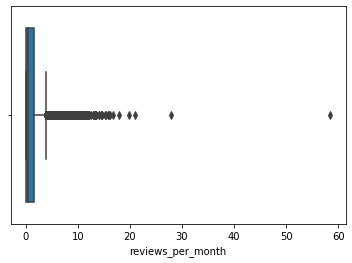

In [65]:
sns.boxplot(df['reviews_per_month'])

In [66]:
reviewmax=df.groupby('host_id')['reviews_per_month'].max()

In [67]:
reviewmax=reviewmax.reset_index()
reviewmax.head()

,host_id,reviews_per_month
0,2438,0.06
1,2571,0.37
2,2787,0.70
3,2845,0.38
4,2868,0.06


In [68]:
px.histogram(reviewmax, x='reviews_per_month',title='max review per month for host')

In [69]:
fig = px.scatter(reviewmax, x="host_id", y="reviews_per_month",title='host and reveiw permonth')
fig.show()

In [70]:
groupdf=pd.merge(groupdf,reviewmax,on="host_id",how='inner')
groupdf.head()

,host_id,host_name,number_of_reviews,reviews_per_month
0,2438,Tasos,1,0.06
1,2571,Teedo,27,0.37
2,2787,John,105,0.70
3,2845,Jennifer,46,0.38
4,2868,Letha M.,2,0.06


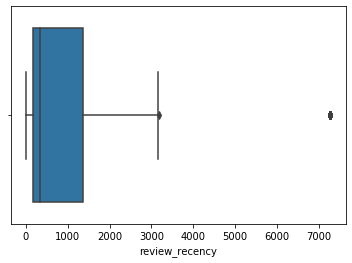

In [71]:
sns.boxplot(df['review_recency'])

In [72]:
reviewrecency=df.groupby('host_id')['review_recency'].min()

In [73]:
reviewrecency=reviewrecency.reset_index()
reviewrecency.head()

,host_id,review_recency
0,2438,629
1,2571,199
2,2787,31
3,2845,199
4,2868,858


In [74]:
px.histogram(reviewrecency, x='review_recency', title='review recency for host')

In [75]:
fig = px.scatter(reviewrecency, x="host_id", y="review_recency", title='host and review recency')
fig.show()

In [76]:
groupdf=pd.merge(groupdf,reviewrecency,on="host_id",how='inner')
groupdf.head()

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency
0,2438,Tasos,1,0.06,629
1,2571,Teedo,27,0.37,199
2,2787,John,105,0.70,31
3,2845,Jennifer,46,0.38,199
4,2868,Letha M.,2,0.06,858


In [77]:
groupdf.shape

(37439, 5)

In [78]:
groupdf.shape

(37439, 5)

In [79]:
groupdf.columns

Index(['host_id', 'host_name', 'number_of_reviews', 'reviews_per_month',
       'review_recency'],
      dtype='object')

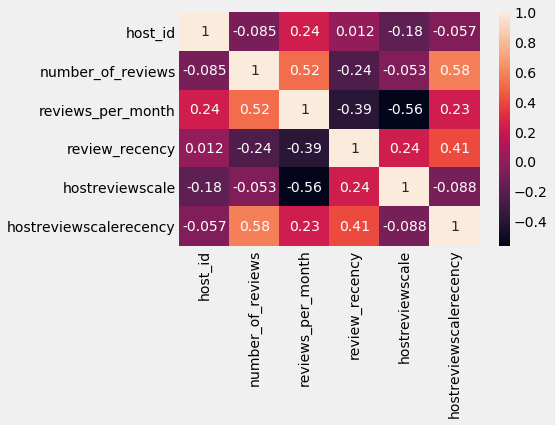

In [279]:
sns.heatmap(groupdf.corr(),annot=True)

In [80]:
# Scaling Features

In [81]:
scaler=StandardScaler()
dfscaledx=scaler.fit_transform(groupdf[['number_of_reviews', 'reviews_per_month','review_recency']])
dfscaledx=pd.DataFrame(dfscaledx)
dfscaledx.columns=['number_of_reviews', 'reviews_per_month','review_recency']
dfscaledx.head()

,number_of_reviews,reviews_per_month,review_recency
0,-0.411884,-0.650212,-0.420755
1,-0.047293,-0.459124,-0.579045
2,1.046480,-0.255708,-0.640888
3,0.219139,-0.452960,-0.579045
4,-0.397862,-0.650212,-0.336456


In [82]:
dfscaled=dfscaledx[['number_of_reviews', 'reviews_per_month']]

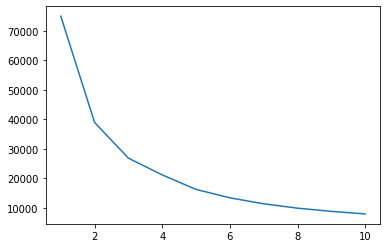

In [83]:
kssd=[]
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(dfscaled)
    kssd.append(km.inertia_)
plt.plot(range(1, 11), kssd)

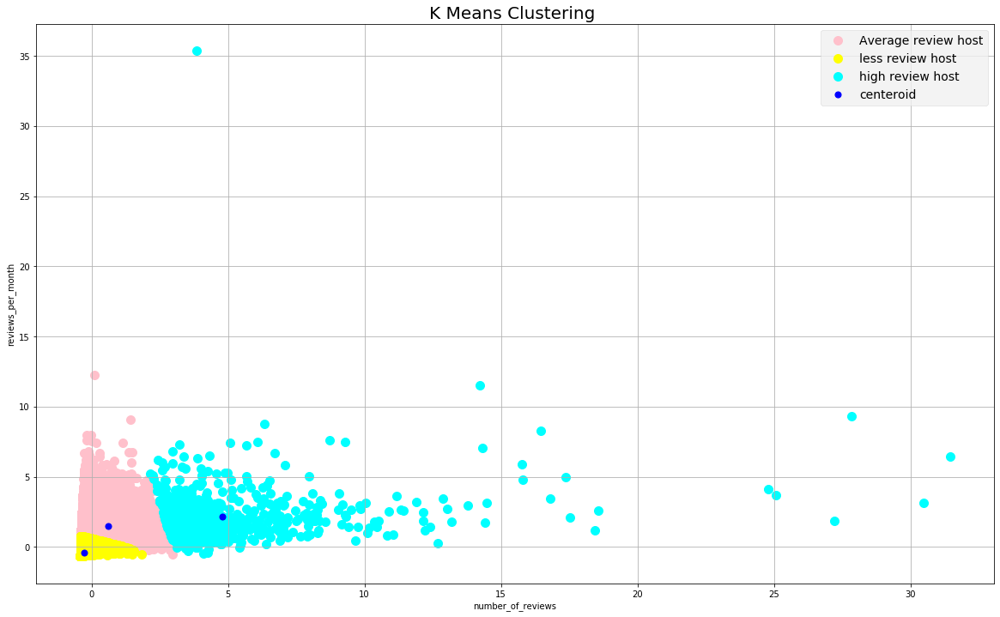

In [84]:
plt.figure(figsize=(20,12))
km = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(dfscaled)
dfscaled = np.array(dfscaled)
plt.scatter(dfscaled[y_means == 0, 0], dfscaled[y_means == 0, 1], s = 100, c = 'pink', label = 'Average review host')
plt.scatter(dfscaled[y_means == 1, 0], dfscaled[y_means == 1, 1], s = 100, c = 'yellow', label = 'less review host')
plt.scatter(dfscaled[y_means == 2, 0], dfscaled[y_means == 2, 1], s = 100, c = 'cyan', label = 'high review host')
#plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'magenta', label = 'Famous Host')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering ', fontsize = 20)
plt.xlabel('number_of_reviews')
plt.ylabel('reviews_per_month')
plt.legend()
plt.grid()
plt.show()

In [85]:
km.labels_

array([1, 1, 1, ..., 1, 1, 1])

In [86]:
groupdf['hostreviewscale']=km.labels_

In [87]:
groupdf.head()

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale
0,2438,Tasos,1,0.06,629,1
1,2571,Teedo,27,0.37,199,1
2,2787,John,105,0.70,31,1
3,2845,Jennifer,46,0.38,199,1
4,2868,Letha M.,2,0.06,858,1


In [88]:
groupdf['hostreviewscale'].value_counts()

1    29214
0     7439
2      786
Name: hostreviewscale, dtype: int64

In [89]:


##

In [90]:
dfscaled=dfscaledx[['number_of_reviews', 'review_recency']]

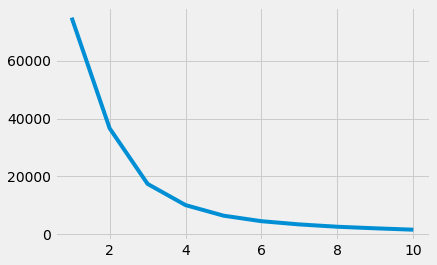

In [91]:
kssd=[]
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(dfscaled)
    kssd.append(km.inertia_)
plt.plot(range(1, 11), kssd)

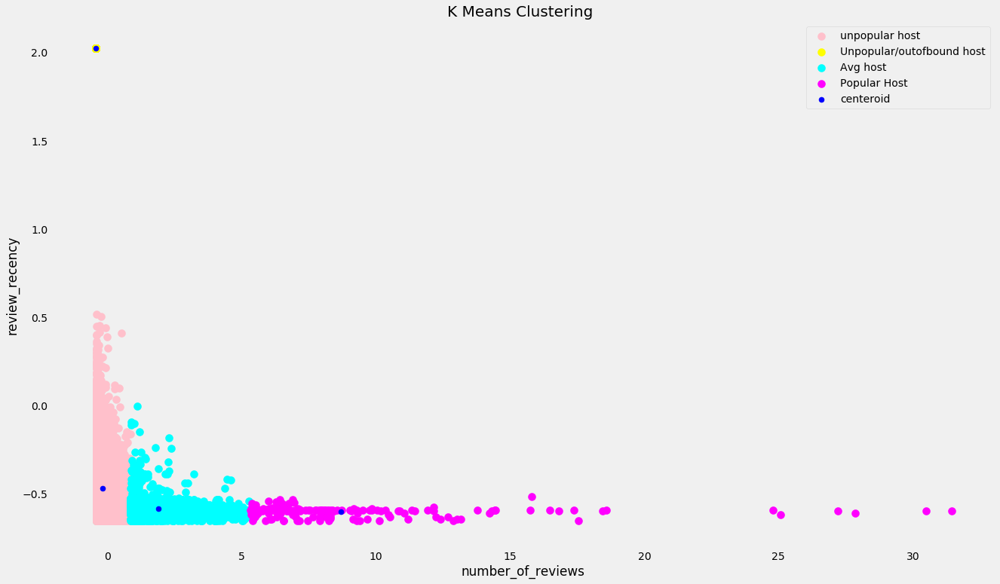

In [92]:
plt.figure(figsize=(20,12))
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(dfscaled)
dfscaled = np.array(dfscaled)
plt.scatter(dfscaled[y_means == 0, 0], dfscaled[y_means == 0, 1], s = 100, c = 'pink', label = 'unpopular host')
plt.scatter(dfscaled[y_means == 1, 0], dfscaled[y_means == 1, 1], s = 100, c = 'yellow', label = 'Unpopular/outofbound host')
plt.scatter(dfscaled[y_means == 2, 0], dfscaled[y_means == 2, 1], s = 100, c = 'cyan', label = 'Avg host')
plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'magenta', label = 'Popular Host')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering ', fontsize = 20)
plt.xlabel('number_of_reviews')
plt.ylabel('review_recency')
plt.legend()
plt.grid()
plt.show()

In [93]:
groupdf['hostreviewscalerecency']=km.labels_

In [94]:
groupdf.head()

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale,hostreviewscalerecency
0,2438,Tasos,1,0.06,629,1,0
1,2571,Teedo,27,0.37,199,1,0
2,2787,John,105,0.70,31,1,2
3,2845,Jennifer,46,0.38,199,1,0
4,2868,Letha M.,2,0.06,858,1,0


In [95]:
groupdf.hostreviewscalerecency.value_counts()

0    26661
1     7201
2     3394
3      183
Name: hostreviewscalerecency, dtype: int64

In [282]:
fig = px.scatter_3d(groupdf, x="number_of_reviews", y="reviews_per_month", z="review_recency",title='3d Scatter for Popular host', width=800,height=800)
fig.show()

## Filtering data with hostreviewscale=2 hi.e high review host and hostreviewscalerecency=3 i.e popular host

In [97]:
result=groupdf.loc[(groupdf.hostreviewscale == 2) & (groupdf.hostreviewscalerecency == 3)]  

In [98]:
result

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale,hostreviewscalerecency
27,7549,Ben,522,1.81,91,2,3
36,8967,Shunichi,430,3.47,165,2,3
37,9744,Laurie,486,1.43,165,2,3
46,12221,Lori,493,2.70,160,2,3
118,32169,Andrea,421,1.65,122,2,3
...,...,...,...,...,...,...,...
32220,158540605,Sonia,478,6.18,160,2,3
32298,159610596,WeWork,422,7.90,152,2,3
32479,162427870,Anna,437,8.68,166,2,3
34629,219517861,Sonder (NYC),1281,4.52,0,2,3


# Listing Neighboorhood 

In [99]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'review_recency'],
      dtype='object')

In [100]:
listingavgprice=df.groupby(['neighbourhood','neighbourhood_group'])['price'].mean()

In [101]:
listingavgprice=listingavgprice.reset_index()
listingavgprice.head()

,neighbourhood,neighbourhood_group,price
0,Allerton,Bronx,87.595238
1,Arden Heights,Staten Island,67.250000
2,Arrochar,Staten Island,115.000000
3,Arverne,Queens,171.779221
4,Astoria,Queens,117.187778


In [102]:
px.histogram(listingavgprice, x='price',title='Avg price for neighbourhood')

In [103]:
fig = px.scatter(listingavgprice, x="neighbourhood", y="price", title='Neighbourhood and Avg price')
fig.show()

In [104]:
groupdfl=listingavgprice
groupdfl

,neighbourhood,neighbourhood_group,price
0,Allerton,Bronx,87.595238
1,Arden Heights,Staten Island,67.250000
2,Arrochar,Staten Island,115.000000
3,Arverne,Queens,171.779221
4,Astoria,Queens,117.187778
...,...,...,...
216,Windsor Terrace,Brooklyn,138.993631
217,Woodhaven,Queens,67.170455
218,Woodlawn,Bronx,60.090909
219,Woodrow,Staten Island,700.000000


In [105]:
groupdfl=listingavgprice

In [106]:
listingavgminnight=df.groupby('neighbourhood')['minimum_nights'].mean()

In [107]:
listingavgminnight=listingavgminnight.reset_index()
listingavgminnight.head()

,neighbourhood,minimum_nights
0,Allerton,2.214286
1,Arden Heights,9.500000
2,Arrochar,2.761905
3,Arverne,1.649351
4,Astoria,6.036667


In [108]:
px.histogram(listingavgminnight, x='minimum_nights',title='Avg min-nights for neighbourhood')

In [109]:
fig = px.scatter(listingavgminnight, x="neighbourhood", y="minimum_nights", title='Neighbourhood and Avg min nights')
fig.show()

In [110]:
groupdfl=pd.merge(groupdfl,listingavgminnight,on="neighbourhood",how='inner')
groupdfl.head()

,neighbourhood,neighbourhood_group,price,minimum_nights
0,Allerton,Bronx,87.595238,2.214286
1,Arden Heights,Staten Island,67.250000,9.500000
2,Arrochar,Staten Island,115.000000,2.761905
3,Arverne,Queens,171.779221,1.649351
4,Astoria,Queens,117.187778,6.036667


In [111]:
listingavgreview=df.groupby('neighbourhood')['number_of_reviews'].mean()

In [112]:
listingavgreview=listingavgreview.reset_index()
listingavgreview.head()

,neighbourhood,number_of_reviews
0,Allerton,42.928571
1,Arden Heights,7.750000
2,Arrochar,14.619048
3,Arverne,29.259740
4,Astoria,21.455556


In [113]:
px.histogram(listingavgreview, x='number_of_reviews',title='Avg number_of_reviews for neighbourhood')

In [114]:
fig = px.scatter(listingavgreview, x="neighbourhood", y="number_of_reviews", title='Neighbourhood and Avg number_of_reviews')
fig.show()

In [115]:
groupdfl=pd.merge(groupdfl,listingavgreview,on="neighbourhood",how='inner')
groupdfl.head()

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews
0,Allerton,Bronx,87.595238,2.214286,42.928571
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000
2,Arrochar,Staten Island,115.000000,2.761905,14.619048
3,Arverne,Queens,171.779221,1.649351,29.259740
4,Astoria,Queens,117.187778,6.036667,21.455556


In [116]:
listingavgavailability=df.groupby('neighbourhood')['availability_365'].mean()

In [117]:
listingavgavailability=listingavgavailability.reset_index()
listingavgavailability.head()

,neighbourhood,availability_365
0,Allerton,163.666667
1,Arden Heights,94.250000
2,Arrochar,255.809524
3,Arverne,188.428571
4,Astoria,109.191111


In [118]:
px.histogram(listingavgavailability, x='availability_365',title='Avg availability_365 for neighbourhood')

In [119]:
fig = px.scatter(listingavgavailability, x="neighbourhood", y="availability_365", title='Neighbourhood and Avg availability_365')
fig.show()

In [120]:
groupdfl=pd.merge(groupdfl,listingavgavailability,on="neighbourhood",how='inner')
groupdfl.head()

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000,94.250000
2,Arrochar,Staten Island,115.000000,2.761905,14.619048,255.809524
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571
4,Astoria,Queens,117.187778,6.036667,21.455556,109.191111


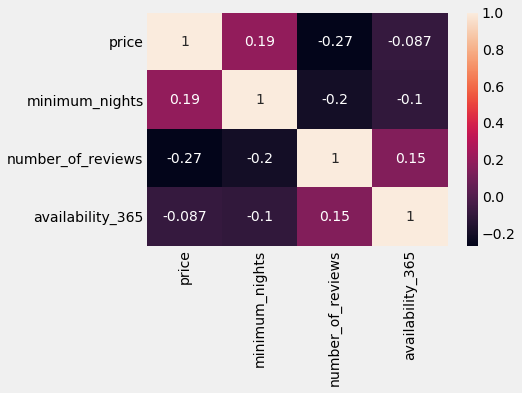

In [121]:
sns.heatmap(groupdfl.corr(),annot=True)

In [122]:
px.histogram(groupdfl, x='price',color='neighbourhood_group',title='Avg price of neighbourhood by neighbourhood group')

In [123]:
px.histogram(groupdfl, x='minimum_nights',color='neighbourhood_group',title='Avg min nights of neighbourhood by neighbourhood group')

In [124]:
px.histogram(groupdfl, x='number_of_reviews',color='neighbourhood_group',title='Avg no. of reveiw of neighbourhood by neighbourhood group')

In [125]:
px.histogram(groupdfl, x='availability_365',color='neighbourhood_group',title='Avg availability of neighbourhood by neighbourhood group')

In [126]:
groupdfl.columns

Index(['neighbourhood', 'neighbourhood_group', 'price', 'minimum_nights',
       'number_of_reviews', 'availability_365'],
      dtype='object')

In [127]:
scaler=StandardScaler()
dfscaledx=scaler.fit_transform(groupdfl[['price', 'minimum_nights', 'number_of_reviews','availability_365']])
dfscaledx=pd.DataFrame(dfscaledx)
dfscaledx.columns=['price', 'minimum_nights', 'number_of_reviews','availability_365']
dfscaledx.head()

,price,minimum_nights,number_of_reviews,availability_365
0,-0.484091,-0.626770,1.280678,0.178797
1,-0.699806,0.715405,-1.081851,-0.935336
2,-0.193527,-0.525887,-0.620539,1.657683
3,0.408486,-0.730842,0.362704,0.576223
4,-0.170331,0.077390,-0.161411,-0.695532


In [128]:

dfs=dfscaledx[['price', 'minimum_nights']]

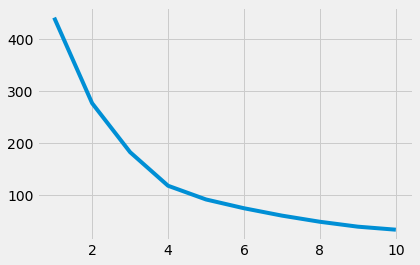

In [129]:
kssd=[]
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(dfs)
    kssd.append(km.inertia_)
plt.plot(range(1, 11), kssd)

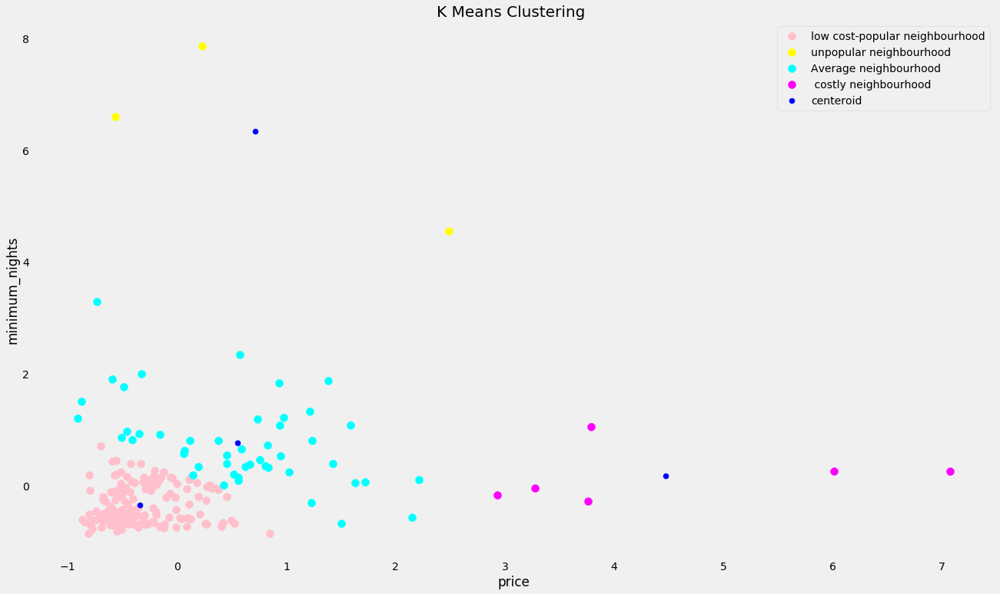

In [130]:
plt.figure(figsize=(20,12))
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(dfs)
dfscaled = np.array(dfs)
plt.scatter(dfscaled[y_means == 0, 0], dfscaled[y_means == 0, 1], s = 100, c = 'pink', label = 'low cost-popular neighbourhood')
plt.scatter(dfscaled[y_means == 1, 0], dfscaled[y_means == 1, 1], s = 100, c = 'yellow', label = 'unpopular neighbourhood')
plt.scatter(dfscaled[y_means == 2, 0], dfscaled[y_means == 2, 1], s = 100, c = 'cyan', label = 'Average neighbourhood')
plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'magenta', label = ' costly neighbourhood')
#plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'green', label = 'Famous Host')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering ', fontsize = 20)
plt.xlabel('price')
plt.ylabel('minimum_nights')
plt.legend()
plt.grid()
plt.show()

In [131]:
groupdfl['nigbourhoodpopularity_minnig_cost']=km.labels_

In [132]:
groupdfl['nigbourhoodpopularity_minnig_cost'].value_counts()  # 0 min night is less cost attract more 

0    164
2     48
3      6
1      3
Name: nigbourhoodpopularity_minnig_cost, dtype: int64

In [133]:
groupdfl

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365,nigbourhoodpopularity_minnig_cost
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667,0
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000,94.250000,0
2,Arrochar,Staten Island,115.000000,2.761905,14.619048,255.809524,0
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571,0
4,Astoria,Queens,117.187778,6.036667,21.455556,109.191111,0
...,...,...,...,...,...,...,...
216,Windsor Terrace,Brooklyn,138.993631,8.713376,27.541401,81.885350,2
217,Woodhaven,Queens,67.170455,2.795455,31.727273,200.920455,0
218,Woodlawn,Bronx,60.090909,1.454545,44.000000,98.272727,0
219,Woodrow,Staten Island,700.000000,7.000000,0.000000,0.000000,3


In [134]:
dfs=dfscaledx[['price', 'number_of_reviews']]

In [135]:
dfs

,price,number_of_reviews
0,-0.484091,1.280678
1,-0.699806,-1.081851
2,-0.193527,-0.620539
3,0.408486,0.362704
4,-0.170331,-0.161411
...,...,...
216,0.060870,0.247304
217,-0.700649,0.528419
218,-0.775711,1.352633
219,6.009049,-1.602327


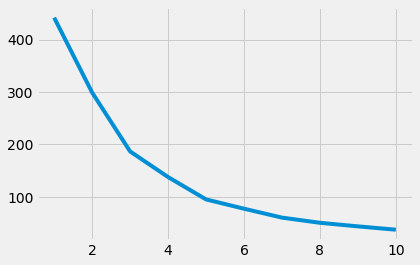

In [136]:
kssd=[]
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(dfs)
    kssd.append(km.inertia_)
plt.plot(range(1, 11), kssd)

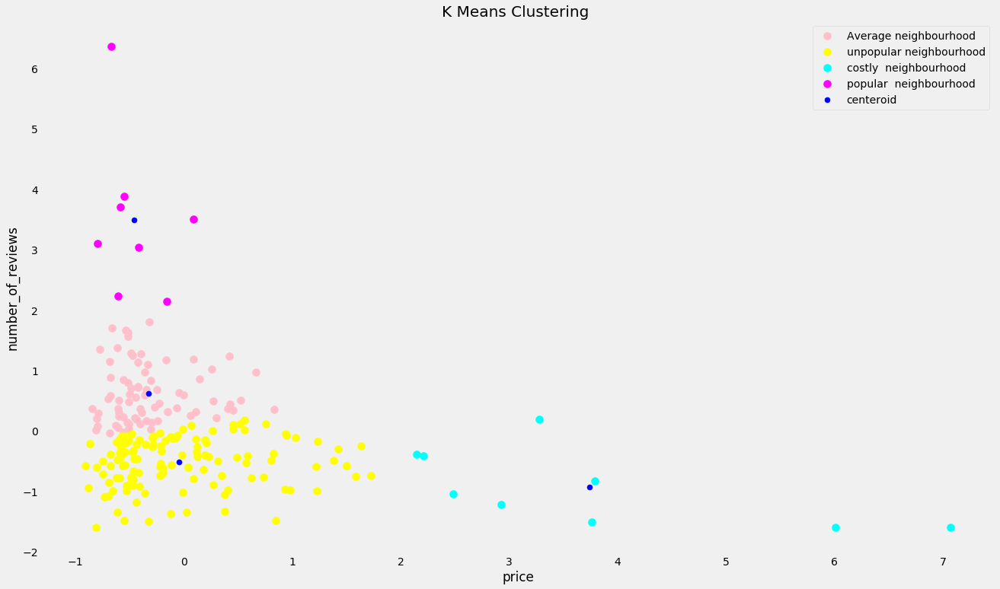

In [137]:
plt.figure(figsize=(20,12))
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(dfs)
dfscaled = np.array(dfs)
plt.scatter(dfscaled[y_means == 0, 0], dfscaled[y_means == 0, 1], s = 100, c = 'pink', label = 'Average neighbourhood')
plt.scatter(dfscaled[y_means == 1, 0], dfscaled[y_means == 1, 1], s = 100, c = 'yellow', label = 'unpopular neighbourhood')
plt.scatter(dfscaled[y_means == 2, 0], dfscaled[y_means == 2, 1], s = 100, c = 'cyan', label = 'costly  neighbourhood')
plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'magenta', label = 'popular  neighbourhood')
#plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'green', label = 'Famous Host')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering ', fontsize = 20)
plt.xlabel('price')
plt.ylabel('number_of_reviews')
plt.legend()
plt.grid()
plt.show()

In [138]:
groupdfl['nigbourhoodpopularity_nreviews_cost']=km.labels_

In [139]:
groupdfl['nigbourhoodpopularity_nreviews_cost'].value_counts()  
# '3' popular neighbourhood low price and high review  but we will consider 0 also as average neighbourhood with low price and average review

1    128
0     76
2      9
3      8
Name: nigbourhoodpopularity_nreviews_cost, dtype: int64

In [140]:
groupdfl

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365,nigbourhoodpopularity_minnig_cost,nigbourhoodpopularity_nreviews_cost
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667,0,0
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000,94.250000,0,1
2,Arrochar,Staten Island,115.000000,2.761905,14.619048,255.809524,0,1
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571,0,0
4,Astoria,Queens,117.187778,6.036667,21.455556,109.191111,0,1
...,...,...,...,...,...,...,...,...
216,Windsor Terrace,Brooklyn,138.993631,8.713376,27.541401,81.885350,2,0
217,Woodhaven,Queens,67.170455,2.795455,31.727273,200.920455,0,0
218,Woodlawn,Bronx,60.090909,1.454545,44.000000,98.272727,0,0
219,Woodrow,Staten Island,700.000000,7.000000,0.000000,0.000000,3,2


In [141]:
dfs=dfscaledx[['price', 'availability_365']]

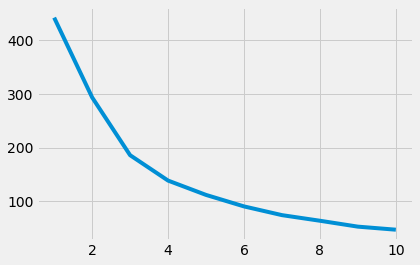

In [142]:
kssd=[]
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(dfs)
    kssd.append(km.inertia_)
plt.plot(range(1, 11), kssd)

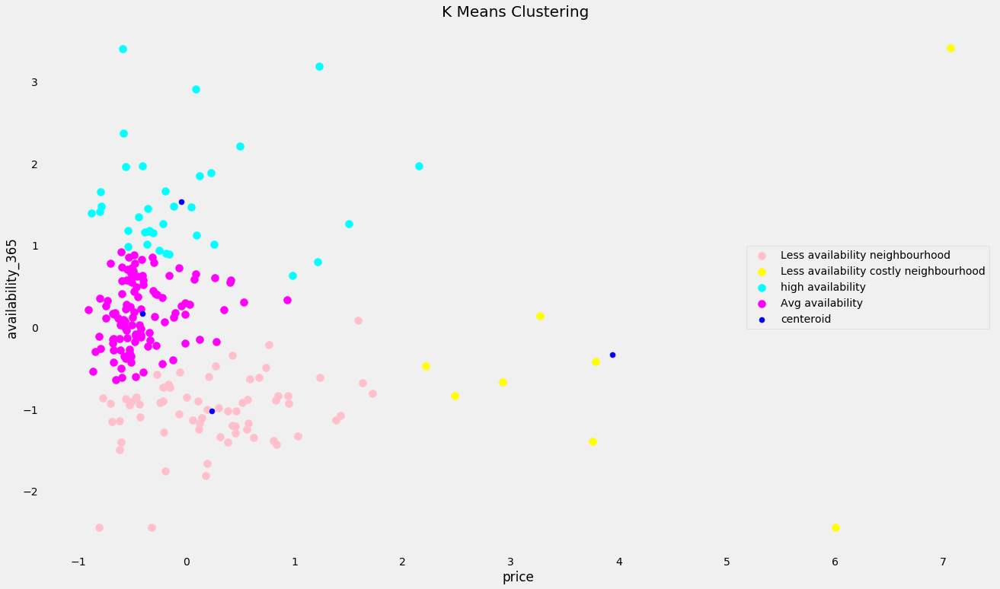

In [143]:
plt.figure(figsize=(20,12))
km = KMeans(n_clusters = 4, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(dfs)
dfscaled = np.array(dfs)
plt.scatter(dfscaled[y_means == 0, 0], dfscaled[y_means == 0, 1], s = 100, c = 'pink', label = 'Less availability neighbourhood')
plt.scatter(dfscaled[y_means == 1, 0], dfscaled[y_means == 1, 1], s = 100, c = 'yellow', label = 'Less availability costly neighbourhood')
plt.scatter(dfscaled[y_means == 2, 0], dfscaled[y_means == 2, 1], s = 100, c = 'cyan', label = 'high availability')
plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'magenta', label = 'Avg availability')
#plt.scatter(dfscaled[y_means == 3, 0], dfscaled[y_means == 3, 1], s = 100, c = 'green', label = 'Famous Host')

plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering ', fontsize = 20)
plt.xlabel('price')
plt.ylabel('availability_365')
plt.legend()
plt.grid()
plt.show()

In [144]:
groupdfl['nigbourhoodpopularity_availability_cost']=km.labels_

In [145]:
groupdfl['nigbourhoodpopularity_availability_cost'].value_counts()
#2 and 3 because listing are highly available for low price

3    111
0     67
2     35
1      8
Name: nigbourhoodpopularity_availability_cost, dtype: int64

In [146]:
groupdfl.head()

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365,nigbourhoodpopularity_minnig_cost,nigbourhoodpopularity_nreviews_cost,nigbourhoodpopularity_availability_cost
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667,0,0,3
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000,94.250000,0,1,0
2,Arrochar,Staten Island,115.000000,2.761905,14.619048,255.809524,0,1,2
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571,0,0,3
4,Astoria,Queens,117.187778,6.036667,21.455556,109.191111,0,1,0


In [147]:
resultlisting=groupdfl

In [148]:
result.head()

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale,hostreviewscalerecency
27,7549,Ben,522,1.81,91,2,3
36,8967,Shunichi,430,3.47,165,2,3
37,9744,Laurie,486,1.43,165,2,3
46,12221,Lori,493,2.70,160,2,3
118,32169,Andrea,421,1.65,122,2,3


In [149]:
resultlisting.head()

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365,nigbourhoodpopularity_minnig_cost,nigbourhoodpopularity_nreviews_cost,nigbourhoodpopularity_availability_cost
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667,0,0,3
1,Arden Heights,Staten Island,67.250000,9.500000,7.750000,94.250000,0,1,0
2,Arrochar,Staten Island,115.000000,2.761905,14.619048,255.809524,0,1,2
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571,0,0,3
4,Astoria,Queens,117.187778,6.036667,21.455556,109.191111,0,1,0


In [150]:
fresultlisting=resultlisting.loc[(resultlisting.nigbourhoodpopularity_minnig_cost == 0) & (resultlisting.nigbourhoodpopularity_nreviews_cost.isin([0,3])) & (resultlisting.nigbourhoodpopularity_availability_cost.isin([2,3]))] 
#fitering popular neighbour hood based on customer preference

In [151]:
fresultlisting

,neighbourhood,neighbourhood_group,price,minimum_nights,number_of_reviews,availability_365,nigbourhoodpopularity_minnig_cost,nigbourhoodpopularity_nreviews_cost,nigbourhoodpopularity_availability_cost
0,Allerton,Bronx,87.595238,2.214286,42.928571,163.666667,0,0,3
3,Arverne,Queens,171.779221,1.649351,29.259740,188.428571,0,0,3
8,Bay Terrace,Queens,142.000000,2.500000,41.500000,222.500000,0,0,2
10,Baychester,Bronx,75.428571,2.428571,44.285714,157.857143,0,0,3
17,Bensonhurst,Brooklyn,75.786667,4.986667,24.600000,134.840000,0,0,3
...,...,...,...,...,...,...,...,...,...
200,University Heights,Bronx,69.571429,2.619048,37.095238,135.285714,0,0,3
205,Wakefield,Bronx,85.580000,3.320000,25.580000,197.700000,0,0,3
207,West Brighton,Staten Island,80.555556,5.166667,36.444444,274.722222,0,0,2
213,Williamsbridge,Bronx,96.750000,5.875000,28.450000,224.450000,0,0,2


In [152]:
fresultlisting.nigbourhoodpopularity_availability_cost.value_counts()

3    51
2    14
Name: nigbourhoodpopularity_availability_cost, dtype: int64

# This segmentation by clustering was intended to identify potential customer segment 

# we can now export resultlisting and result and make analysis by filtering out as per target segment in tableau or plotly

In [153]:
fhost=result.loc[(result.hostreviewscale==2)]


In [154]:
fhost.sort_values(by='number_of_reviews', ascending=False)

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale,hostreviewscalerecency
21304,37312959,Maya,2273,11.59,152,2,3
1052,344035,Brooklyn& Breakfast -Len-,2205,6.23,159,2,3
18626,26432133,Danielle,2017,16.22,121,2,3
20872,35524316,Yasu & Akiko,1971,4.13,153,2,3
21921,40176101,Brady,1818,7.07,91,2,3
...,...,...,...,...,...,...,...
1734,722320,Gladys & Bob,414,4.34,274,2,3
10330,8338942,Victor,414,6.36,167,2,3
628,190409,Waundell,413,2.04,159,2,3
1498,588270,Dikla,413,3.33,91,2,3


In [155]:
recencyhost=result.loc[(result.hostreviewscalerecency==3)]
recencyhost.sort_values(by='review_recency', ascending=True)

,host_id,host_name,number_of_reviews,reviews_per_month,review_recency,hostreviewscale,hostreviewscalerecency
23551,47993495,Mama,540,3.87,0,2,3
14460,16155254,Lina,534,3.93,0,2,3
9760,7558452,Zev,619,5.68,0,2,3
24225,50600973,Joyell,949,6.68,0,2,3
24983,55468128,Reina,562,5.28,0,2,3
...,...,...,...,...,...,...,...
21408,37818581,Sofia,479,4.95,288,2,3
12856,12366541,Pj,459,4.10,303,2,3
13109,12949460,Asa,488,8.14,333,2,3
247,64442,Reka,522,4.72,333,2,3


In [156]:
result['host_name'].values

array(['Ben', 'Shunichi', 'Laurie', 'Lori', 'Andrea', 'Ssameer Or Trip',
       'Dani', 'Edward', 'Luiz', 'Reka', 'Lulú', 'Amy', 'Anthony',
       'Evelyn', 'Waldemar', 'Renée', 'Waundell', 'Marylyn', 'Victor',
       'Jsun', 'Jason', 'Wayne', 'Jon', 'Agnes', 'Lissette', 'Maya',
       'Dennis & Naoko', 'Anthony', 'Brooklyn&   Breakfast    -Len-',
       'The Box House Hotel', 'Dikla', 'Seith', 'Karen', 'Chris And Zach',
       'Gladys & Bob', 'Wanda', 'Christian & Carla', 'Dennis', 'Jessica',
       'Tim', 'Daniel', 'Jake', 'Janina', 'Marcella & Saidat', 'Jason',
       'Jay', 'Mark', 'Majar', 'John', 'Gary', 'Lloyd', 'Carol', 'Hannah',
       'Biren', 'Gina', 'Charles', 'Linda', 'Kalae', 'Olga', 'Angelo',
       'Amaya', 'Jasmin', 'Janet-David', 'Greg', 'Enrique', 'Kevin',
       'Brinton', 'Christina', 'Jj', 'Seth', 'Adrianne',
       'Hassan And Patti', 'Amy', 'Rocio & James', 'Jason', 'Robert',
       'Emmanuelle', 'Martin', 'Eric', 'Randy', 'Louise', 'Zev', 'Bobi',
       'Naima'

In [157]:
def identifiedhost(x):
    host=['Ben', 'Shunichi', 'Laurie', 'Lori', 'Andrea', 'Ssameer Or Trip',
       'Dani', 'Edward', 'Luiz', 'Reka', 'Lulú', 'Amy', 'Anthony',
       'Evelyn', 'Waldemar', 'Renée', 'Waundell', 'Marylyn', 'Victor',
       'Jsun', 'Jason', 'Wayne', 'Jon', 'Agnes', 'Lissette', 'Maya',
       'Dennis & Naoko', 'Anthony', 'Brooklyn&   Breakfast    -Len-',
       'The Box House Hotel', 'Dikla', 'Seith', 'Karen', 'Chris And Zach',
       'Gladys & Bob', 'Wanda', 'Christian & Carla', 'Dennis', 'Jessica',
       'Tim', 'Daniel', 'Jake', 'Janina', 'Marcella & Saidat', 'Jason',
       'Jay', 'Mark', 'Majar', 'John', 'Gary', 'Lloyd', 'Carol', 'Hannah',
       'Biren', 'Gina', 'Charles', 'Linda', 'Kalae', 'Olga', 'Angelo',
       'Amaya', 'Jasmin', 'Janet-David', 'Greg', 'Enrique', 'Kevin',
       'Brinton', 'Christina', 'Jj', 'Seth', 'Adrianne',
       'Hassan And Patti', 'Amy', 'Rocio & James', 'Jason', 'Robert',
       'Emmanuelle', 'Martin', 'Eric', 'Randy', 'Louise', 'Zev', 'Bobi',
       'Naima', 'Victor', 'Jacob', 'Ravanna', 'Grover', 'Antonio',
       'Emily And Joel', 'Erica And Jorel', 'Memo & Iso', 'Mike', 'Gio',
       'Joni', 'Pj', 'Asa', 'Rossy,  Carmen And Juan', 'Chadanut',
       'Ksenia & Masha', 'Lina', 'Alex And Zeena', 'Ian', 'Anne',
       'Steven', 'Yan', 'Sophie', 'Michael', 'Yevgeny', 'Paulette',
       'Veronica', 'Shahana', 'Gurpreet  Singh', 'Angela', 'Carlina',
       'Sarah', 'Andreias', 'Danielle', 'Glenda', 'Amy', 'Adam & Allen',
       'John', 'Elisabeth', 'Troy', 'Laura', 'Alec', 'Benjamin',
       'Besinfe', 'Yasu & Akiko', 'Maya', 'Sofia', 'Brady', 'Nora',
       'Hayes', 'Lolita', 'Lucilu', 'Jason', 'Dona', 'Mama', 'Joyell',
       'Joe', 'Kc', 'Yvonne', 'Reina', 'Juel', 'Han', 'Josh & Madeleine',
       'Corporate Housing', 'Kevin And Kitty', 'Jaleh', 'Shirley',
       'Michelle & Eddie', 'Silvia', 'Leo', 'Shera', 'Nurcan', 'Maba',
       'Adeyemi', 'Miss Dy', 'Michael', 'Ian', 'The Wrights', 'Kaka',
       'Marilyn', 'Maria', 'Kevin', 'Melissa', 'Sonia', 'Jimmy &Cindy',
       'Deloris', 'Nahuel', 'Mira', 'Alena', 'David', 'Shuly', 'Sam',
       'Nalicia', 'Asad', 'Sonia', 'WeWork', 'Anna', 'Sonder (NYC)',
       'Lakshmee']
    for i in host:
        if i==x:
            return 'Popular'

In [158]:
df['Segmented_review']=df.host_name.apply(identifiedhost)

C:\Users\Pratiksinh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [159]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,413,Popular
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,199,None
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2000-01-01,0.00,1,365,7279,Popular
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-05-07,4.64,1,194,213,None
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,382,Popular


In [160]:
fresultlisting['neighbourhood'].values

array(['Allerton', 'Arverne', 'Bay Terrace', 'Baychester', 'Bensonhurst',
       'Bronxdale', 'Brownsville', 'Canarsie', 'Clifton', 'Concord',
       'Concourse', 'Concourse Village', 'Corona', 'Cypress Hills',
       'Ditmars Steinway', 'Dyker Heights', 'East Elmhurst',
       'East Flatbush', 'East Morrisania', 'East New York', 'Elmhurst',
       'Eltingville', 'Flushing', 'Fresh Meadows', 'Glendale',
       'Graniteville', 'Grant City', 'Highbridge', 'Huguenot',
       'Jackson Heights', 'Jamaica', 'Jamaica Estates', 'Laurelton',
       'Lighthouse Hill', 'Longwood', 'Manhattan Beach', 'Middle Village',
       'Morris Heights', 'Mott Haven', 'Mount Eden', 'New Brighton',
       'Ozone Park', 'Parkchester', 'Pelham Bay', 'Pelham Gardens',
       'Queens Village', 'Rego Park', 'Richmond Hill', 'Richmondtown',
       'Rosebank', 'Rosedale', 'Schuylerville', 'Silver Lake',
       'Soundview', 'South Ozone Park', 'Springfield Gardens',
       'St. Albans', 'Stapleton', 'Throgs Neck', 'To

In [161]:
def listingneighbourhood(x):
    neigh=['Allerton', 'Arverne', 'Bay Terrace', 'Baychester', 'Bensonhurst',
       'Bronxdale', 'Brownsville', 'Canarsie', 'Clifton', 'Concord',
       'Concourse', 'Concourse Village', 'Corona', 'Cypress Hills',
       'Ditmars Steinway', 'Dyker Heights', 'East Elmhurst',
       'East Flatbush', 'East Morrisania', 'East New York', 'Elmhurst',
       'Eltingville', 'Flushing', 'Fresh Meadows', 'Glendale',
       'Graniteville', 'Grant City', 'Highbridge', 'Huguenot',
       'Jackson Heights', 'Jamaica', 'Jamaica Estates', 'Laurelton',
       'Lighthouse Hill', 'Longwood', 'Manhattan Beach', 'Middle Village',
       'Morris Heights', 'Mott Haven', 'Mount Eden', 'New Brighton',
       'Ozone Park', 'Parkchester', 'Pelham Bay', 'Pelham Gardens',
       'Queens Village', 'Rego Park', 'Richmond Hill', 'Richmondtown',
       'Rosebank', 'Rosedale', 'Schuylerville', 'Silver Lake',
       'Soundview', 'South Ozone Park', 'Springfield Gardens',
       'St. Albans', 'Stapleton', 'Throgs Neck', 'Tompkinsville',
       'University Heights', 'Wakefield', 'West Brighton',
       'Williamsbridge', 'Woodhaven']
    for i in neigh:
        if i==x:
            return 'Popular Neighbourhood'

In [162]:
df['Segmented_Neighbourhood']=df.neighbourhood.apply(listingneighbourhood)

C:\Users\Pratiksinh\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [163]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,413,Popular,None
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,199,None,None
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,2000-01-01,0.00,1,365,7279,Popular,None
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-05-07,4.64,1,194,213,None,None
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,382,Popular,None


In [164]:
df['Segmented_Neighbourhood'].value_counts()

Popular Neighbourhood    4435
Name: Segmented_Neighbourhood, dtype: int64

In [166]:
filterdf=df.loc[(df['Segmented_Neighbourhood']=='Popular Neighbourhood')]
filterdf

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
143,32363,Fully Furnished Basement Apartment,140025,Fredah,Queens,Flushing,40.74028,-73.83168,Private room,140,2,1,2011-09-19,0.01,1,1,3000,None,Popular Neighbourhood
171,44096,Room with a View,190409,Waundell,Bronx,Highbridge,40.83232,-73.93184,Private room,40,1,219,2019-04-07,2.04,3,353,243,Popular,Popular Neighbourhood
196,51850,( F) Excellent/Pvt Rm,27848,Jullett,Queens,Jamaica,40.67252,-73.76597,Private room,55,2,52,2019-05-20,0.49,2,365,200,None,Popular Neighbourhood
199,53469,cozy studio with parking spot,204539,Mark,Queens,Middle Village,40.71722,-73.87856,Entire home/apt,98,30,33,2015-09-05,0.31,5,240,1553,Popular,Popular Neighbourhood
201,53477,3 floors of luxury!,204539,Mark,Queens,Middle Village,40.71546,-73.87854,Entire home/apt,265,7,38,2019-04-27,0.38,5,365,223,Popular,Popular Neighbourhood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48851,36455649,#7 New Hotel-Like Private Room KING bed near JFK,263504959,David,Queens,Woodhaven,40.69137,-73.86591,Private room,35,1,0,2000-01-01,0.00,8,341,7279,Popular,Popular Neighbourhood
48857,36457832,"❥NYC Apt: 4min/subway, 25m/city, 20m/LGA,JFK❥",63272360,Annie Lawrence,Queens,Woodhaven,40.69482,-73.86618,Entire home/apt,85,3,0,2000-01-01,0.00,6,300,7279,None,Popular Neighbourhood
48858,36458668,"2beds Private Room Step to LGA, CitiFiled, Mid...",217463199,Marvy,Queens,Flushing,40.74387,-73.82556,Private room,68,3,0,2000-01-01,0.00,4,362,7279,None,Popular Neighbourhood
48878,36479723,Room for rest,41326856,Jeerathinan,Queens,Elmhurst,40.74477,-73.87727,Private room,45,1,0,2000-01-01,0.00,5,172,7279,None,Popular Neighbourhood


# XXXXXXXXXXXXXXXXXX

In [190]:
px.histogram(filterdf, x='neighbourhood_group',color='neighbourhood_group',title='Segmented listing by Popular neighbourhood group')

In [191]:
help(px.bar)

Help on function bar in module plotly.express._chart_types:

bar(data_frame=None, x=None, y=None, color=None, facet_row=None, facet_col=None, facet_col_wrap=0, facet_row_spacing=None, facet_col_spacing=None, hover_name=None, hover_data=None, custom_data=None, text=None, base=None, error_x=None, error_x_minus=None, error_y=None, error_y_minus=None, animation_frame=None, animation_group=None, category_orders={}, labels={}, color_discrete_sequence=None, color_discrete_map={}, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, opacity=None, orientation=None, barmode='relative', log_x=False, log_y=False, range_x=None, range_y=None, title=None, template=None, width=None, height=None)
        In a bar plot, each row of `data_frame` is represented as a rectangular
        mark.
        
    Parameters
    ----------
    data_frame: DataFrame or array-like or dict
        This argument needs to be passed for column names (and not keyword
        names) to be used. Ar

In [192]:
px.histogram(filterdf, x='neighbourhood',color='neighbourhood_group',title='Segmented listing by popular neighbourhood by various neighbourhood group')

In [193]:
px.histogram(filterdf, x='room_type',color='room_type',title='Segemented listing popular room type')

In [194]:
px.histogram(filterdf, x='neighbourhood_group',color='room_type',title='Segmented listing by popular Neighbourhood group by room type')

In [195]:
px.histogram(filterdf, x='neighbourhood',color='room_type',title='Segmented listing by popular Neighbourhood  by room type')

In [196]:
fig = px.sunburst(filterdf, path=['neighbourhood_group', 'neighbourhood','room_type'],
                  title=' Segmented listing by Popular neighbourhoods with preferred room type')
fig.show()

In [197]:
fig = px.violin(filterdf, y="price",title='Segmented listing by popular neigbourhood-preferred price')
fig.show()

In [198]:
fig = px.violin(filterdf, y="minimum_nights",title='Segmented listing by popular neigbourhood -minimum nights')
fig.show()

In [199]:
fig = px.violin(filterdf, y="availability_365",title='Segmented listing by popular neigbourhood -availability 365')
fig.show()

In [200]:
fig = px.violin(filterdf, y="number_of_reviews",title='Segmented listing by popular neigbourhood -number_of_reviews')
fig.show()

In [257]:
fig = px.bar(filterdf, x='neighbourhood', y='number_of_reviews')
fig.show()

In [259]:
fig = px.bar(filterdf, x='neighbourhood', y='price', color='neighbourhood_group')
fig.show()

In [261]:
fig = px.bar(filterdf, x='neighbourhood', y='availability_365', color='neighbourhood_group')
fig.show()

In [271]:
fig = px.sunburst(filterdf, path=['neighbourhood_group', 'neighbourhood','room_type'], values='price',
                title='Neighbourhood and room type by price',
                  width=800,height=800)
fig.show()

In [270]:
fig = px.sunburst(filterdf, path=['neighbourhood_group', 'neighbourhood','room_type'], values='number_of_reviews',
                  title='Neighbourhood and room type by number of reviews',
                  width=800,height=800)
fig.show()

In [188]:
filterdf.to_csv(r'c:\Users\Pratiksinh\Upgrad\Kaagle Projects\neigbourhoodsegment.csv',index=False)

In [206]:
filterdf1=df.loc[(df['Segmented_review']=='Popular')&(df['review_recency']<7279)]
filterdf1

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,413,Popular,None
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,382,Popular,None
7,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Hell's Kitchen,40.76489,-73.98493,Private room,79,2,430,2019-06-24,3.47,1,220,165,Popular,None
9,5238,Cute & Cozy Lower East Side 1 bdrm,7549,Ben,Manhattan,Chinatown,40.71344,-73.99037,Entire home/apt,150,1,160,2019-09-06,1.33,4,188,91,Popular,None
12,5803,"Lovely Room 1, Garden, Best Area, Legal rental",9744,Laurie,Brooklyn,South Slope,40.66829,-73.98779,Private room,89,4,167,2019-06-24,1.34,3,314,165,Popular,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48351,36209003,A homey home.,272327753,Robert,Brooklyn,Bay Ridge,40.62373,-74.02676,Entire home/apt,200,1,2,2019-08-07,2.00,1,356,121,Popular,None
48392,36235154,Top on Manhattan,3850264,Jason,Manhattan,Harlem,40.80658,-73.95736,Private room,138,3,1,2019-03-07,1.00,2,65,274,Popular,None
48701,36390226,Comfortable clean Bedstuy private room,267932490,Angela,Brooklyn,Bedford-Stuyvesant,40.69551,-73.93951,Private room,45,1,2,2019-08-07,2.00,1,14,121,Popular,None
48732,36411407,Brand new 1 bedroom steps from Soho!,33917435,Mike,Manhattan,Lower East Side,40.71825,-73.99019,Entire home/apt,150,4,1,2019-06-07,1.00,1,13,182,Popular,None


In [218]:
px.histogram(filterdf1, x='neighbourhood_group',title='Segmented listing by popular host for  neighbourhood group')

In [272]:
px.histogram(filterdf1, x='host_name',color='neighbourhood_group',title='Segmented listing- popular Host by neighbourhood group')

In [217]:
fig = px.sunburst(filterdf1, path=['neighbourhood_group', 'neighbourhood','host_name'],
                  title=' Segmented listing by Popular host',width=1600, height=1600)
fig.show()

In [220]:
px.histogram(filterdf1, x='host_name',color='room_type',title='segmented popular host  by room type')

In [226]:
fig = px.violin(filterdf1, y="price",title='Segmented listing by popular host -price')
fig.show()

In [225]:
fig = px.violin(filterdf1, y="minimum_nights",title='Segmented listing by popular host -minimum nights')
fig.show()

In [224]:
fig = px.violin(filterdf1, y="availability_365",title='Segmented listing by popular host -availability 365')
fig.show()

In [227]:
fig = px.violin(filterdf1, y="number_of_reviews",title='Segmented listing by popular host -number_of_reviews')
fig.show()

In [236]:
filterdf1.to_csv(r'c:\Users\Pratiksinh\Upgrad\Kaagle Projects\segmenthost.csv',index=False)

In [228]:
#Finding host for segmented listing

In [229]:
filterdf2=filterdf1.loc[(df['Segmented_Neighbourhood']=='Popular Neighbourhood')]
filterdf2

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
171,44096,Room with a View,190409,Waundell,Bronx,Highbridge,40.83232,-73.93184,Private room,40,1,219,2019-04-07,2.04,3,353,243,Popular,Popular Neighbourhood
199,53469,cozy studio with parking spot,204539,Mark,Queens,Middle Village,40.71722,-73.87856,Entire home/apt,98,30,33,2015-09-05,0.31,5,240,1553,Popular,Popular Neighbourhood
201,53477,3 floors of luxury!,204539,Mark,Queens,Middle Village,40.71546,-73.87854,Entire home/apt,265,7,38,2019-04-27,0.38,5,365,223,Popular,Popular Neighbourhood
207,54626,Cozy bedroom by Yankee Stadium,190409,Waundell,Bronx,Highbridge,40.83075,-73.93058,Private room,45,1,138,2019-06-30,1.45,3,323,159,Popular,Popular Neighbourhood
249,62452,A SpeciaL!! Private Room in NY,303939,Lissette,Staten Island,Tompkinsville,40.63536,-74.08537,Private room,36,2,193,2019-06-25,1.85,6,360,164,Popular,Popular Neighbourhood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47019,35547124,Cozy room in family home near subway,173794097,Jessica,Queens,Jackson Heights,40.75304,-73.87661,Private room,40,2,2,2019-06-21,2.00,1,3,168,Popular,Popular Neighbourhood
47433,35732847,A lovely room in a great house close to RUMC.,102263916,John,Staten Island,Tompkinsville,40.63281,-74.09132,Private room,50,1,4,2019-07-07,4.00,2,84,152,Popular,Popular Neighbourhood
47708,35875858,#3 Hotel-Like LOFT Private Room KING Bed Near JFK,263504959,David,Queens,Woodhaven,40.69298,-73.86396,Private room,50,1,6,2019-04-07,6.00,8,288,243,Popular,Popular Neighbourhood
47749,35898731,#4 Hotel-Like LOFT Private Room KING bed near JFK,263504959,David,Queens,Woodhaven,40.69311,-73.86526,Private room,50,1,4,2019-07-07,4.00,8,283,152,Popular,Popular Neighbourhood


In [273]:
px.histogram(filterdf2, x='neighbourhood_group',color='neighbourhood_group',title='Neighbourhood group in niche segment')

In [274]:
px.histogram(filterdf2, x='room_type',color='room_type' ,title='Room type in niche segment')

In [275]:
px.histogram(filterdf2, x='neighbourhood',color='neighbourhood_group',title='Neighbourhood  in niche segment')

In [276]:
px.histogram(filterdf2, x='neighbourhood',color='room_type', title='Emerging Neighbourhood by  Room type in niche segment')

In [277]:
px.histogram(filterdf2, x='host_name',color='neighbourhood_group',title='Emerging host in Niche segment ')

In [278]:
px.histogram(filterdf2, x='host_name',color='room_type',title='Popular host by room type')

In [229]:
fig = px.bar(filterdf2, x='neighbourhood', y='price',color='neighbourhood_group', title='Price range in Popular Neighbourhood')
fig.show()

In [231]:
fig = px.bar(filterdf2, x='neighbourhood', y='availability_365',color='neighbourhood_group', title='Listing availability range in Popular Neighbourhood')
fig.show()

In [249]:
fig = px.violin(filterdf2, y="price",title='Niche segment listing - price distribution')
fig.show()

In [248]:
fig = px.violin(filterdf2, y="minimum_nights",title='Niche segment listing -minimum nights distribution')
fig.show()

In [247]:
fig = px.violin(filterdf2, y="availability_365",title='Niche segment listing -availability 365 distribution')
fig.show()

In [246]:
fig = px.violin(filterdf2, y="review_recency",title='Niche segment listing -availability 365 distribution')
fig.show()

In [284]:

fig = px.scatter_3d(filterdf1, x='minimum_nights', y='price', z='availability_365',
              color='room_type',title='3d Scatter by room_type')
fig.show()

In [253]:
fig = px.sunburst(filterdf2, path=['neighbourhood_group', 'neighbourhood','room_type'], values='minimum_nights',
                  color='price', hover_data=['availability_365'] ,title='Niche segment- neighbourhood price distribution by room type',
                  width=800,height=800)
fig.show()

In [240]:
fig = px.sunburst(filterdf2, path=['neighbourhood_group', 'neighbourhood','room_type','number_of_reviews'], values='number_of_reviews'
                  ,title='Emerging  neighbourhood and room type by number of reviews')
fig.show()

In [238]:
fig = px.sunburst(filterdf1, path=['neighbourhood_group', 'neighbourhood','room_type','number_of_reviews'], values='number_of_reviews'
                  ,title='Emerging  neighbourhood and room type by number of reviews')
fig.show()

In [239]:
fig = px.sunburst(filterdf1, path=['neighbourhood_group', 'neighbourhood','room_type','price'], values='price'
                  ,title='Emerging  neighbourhood and room type by number of reviews')
fig.show()

In [259]:
filterdf2.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
171,44096,Room with a View,190409,Waundell,Bronx,Highbridge,40.83232,-73.93184,Private room,40,1,219,2019-04-07,2.04,3,353,243,Popular,Popular Neighbourhood
199,53469,cozy studio with parking spot,204539,Mark,Queens,Middle Village,40.71722,-73.87856,Entire home/apt,98,30,33,2015-09-05,0.31,5,240,1553,Popular,Popular Neighbourhood
201,53477,3 floors of luxury!,204539,Mark,Queens,Middle Village,40.71546,-73.87854,Entire home/apt,265,7,38,2019-04-27,0.38,5,365,223,Popular,Popular Neighbourhood
207,54626,Cozy bedroom by Yankee Stadium,190409,Waundell,Bronx,Highbridge,40.83075,-73.93058,Private room,45,1,138,2019-06-30,1.45,3,323,159,Popular,Popular Neighbourhood
249,62452,A SpeciaL!! Private Room in NY,303939,Lissette,Staten Island,Tompkinsville,40.63536,-74.08537,Private room,36,2,193,2019-06-25,1.85,6,360,164,Popular,Popular Neighbourhood


In [267]:
filterdf2['price']
fig = px.violin(filterdf2, y="price")
fig.show()

In [269]:
fig = px.violin(filterdf2, y="minimum_nights")
fig.show()

In [272]:
fig = px.violin(filterdf2, y="number_of_reviews")
fig.show()

In [276]:
filterdf2['availability_365'].value_counts()

0      64
365    24
341    10
90      9
180     9
       ..
146     1
145     1
144     1
142     1
133     1
Name: availability_365, Length: 255, dtype: int64

In [283]:
# min night =1-3
#price= 50
filterdf2

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,review_recency,Segmented_review,Segmented_Neighbourhood
171,44096,Room with a View,190409,Waundell,Bronx,Highbridge,40.83232,-73.93184,Private room,40,1,219,2019-04-07,2.04,3,353,243,Popular,Popular Neighbourhood
199,53469,cozy studio with parking spot,204539,Mark,Queens,Middle Village,40.71722,-73.87856,Entire home/apt,98,30,33,2015-09-05,0.31,5,240,1553,Popular,Popular Neighbourhood
201,53477,3 floors of luxury!,204539,Mark,Queens,Middle Village,40.71546,-73.87854,Entire home/apt,265,7,38,2019-04-27,0.38,5,365,223,Popular,Popular Neighbourhood
207,54626,Cozy bedroom by Yankee Stadium,190409,Waundell,Bronx,Highbridge,40.83075,-73.93058,Private room,45,1,138,2019-06-30,1.45,3,323,159,Popular,Popular Neighbourhood
249,62452,A SpeciaL!! Private Room in NY,303939,Lissette,Staten Island,Tompkinsville,40.63536,-74.08537,Private room,36,2,193,2019-06-25,1.85,6,360,164,Popular,Popular Neighbourhood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47019,35547124,Cozy room in family home near subway,173794097,Jessica,Queens,Jackson Heights,40.75304,-73.87661,Private room,40,2,2,2019-06-21,2.00,1,3,168,Popular,Popular Neighbourhood
47433,35732847,A lovely room in a great house close to RUMC.,102263916,John,Staten Island,Tompkinsville,40.63281,-74.09132,Private room,50,1,4,2019-07-07,4.00,2,84,152,Popular,Popular Neighbourhood
47708,35875858,#3 Hotel-Like LOFT Private Room KING Bed Near JFK,263504959,David,Queens,Woodhaven,40.69298,-73.86396,Private room,50,1,6,2019-04-07,6.00,8,288,243,Popular,Popular Neighbourhood
47749,35898731,#4 Hotel-Like LOFT Private Room KING bed near JFK,263504959,David,Queens,Woodhaven,40.69311,-73.86526,Private room,50,1,4,2019-07-07,4.00,8,283,152,Popular,Popular Neighbourhood


In [255]:
filterdf2.to_csv(r'c:\Users\Pratiksinh\Upgrad\Kaagle Projects\nichesegment.csv',index=False)

In [ ]:
fig = px.scatter_3d(groupdf, x="number_of_reviews", y="reviews_per_month", z="review_recency",title='3d Scatter for Popular host', width=800,height=800)
fig.show()